In this notebook, we will build a 3D map of a scene from a small set of images and then localize an image downloaded from the Internet. This demo was contributed by [Philipp Lindenberger](https://github.com/Phil26AT/).

In [1]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook
import pycolmap
tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_exhaustive, pairs_from_retrieval


from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d
import pycolmap

# Setup
Here we define some output paths.

In [2]:
#Path where database exists.
images = Path('datasets/cuparking-20221101')
#Path where outputs will be stored
outputs = Path('outputs/cuparking-20221101/')

#!rm -rf $outputs(this command will remove outputs when we start running)

#Path and filename of sfm_pairs (pairs of database images which will be used in reconstruction)
sfm_pairs = outputs / 'pairs-sfm.txt' 
#Path and filename of loc_pairs (pairs of database and query images which will be use in pose estimation)
loc_pairs = outputs / 'pairs-loc.txt'
#Path and foldername which stores the colmap sparse model
sfm_dir = outputs / 'sfm_superpoint+superglue'
#Path and h5_filename which will be used to store features from superpoint 
features = outputs / 'features.h5'
#Path and h5_filename which will be used to store matching from superglue
matches = outputs / 'matches.h5'
#Path and h5_filename that will stores global descriptor from retrieval model.
global_des = outputs / 'global-des-openibl.h5'

#set config retrieval , extract, match 
retrieval_conf = extract_features.confs['netvlad']
feature_conf = extract_features.confs['superpoint_aachen']
matcher_conf = match_features.confs['superglue']

# 3D mapping

# 1. List all mapping image (db)

First we list the images used for mapping.

128 mapping images
['db/p002-d5-f00064.jpg', 'db/p013-d1-f00316.jpg', 'db/p007-d3-f00178.jpg', 'db/p002-d4-f00061.jpg', 'db/p013-d7-f00334.jpg', 'db/p013-d4-f00325.jpg', 'db/p009-d6-f00235.jpg', 'db/p010-d6-f00259.jpg', 'db/p002-d3-f00058.jpg', 'db/p010-d1-f00244.jpg', 'db/p004-d3-f00106.jpg', 'db/p006-d0-f00145.jpg', 'db/p008-d2-f00199.jpg', 'db/p015-d7-f00382.jpg', 'db/p009-d5-f00232.jpg', 'db/p009-d7-f00238.jpg', 'db/p002-d1-f00052.jpg', 'db/p001-d5-f00040.jpg', 'db/p002-d6-f00067.jpg', 'db/p011-d2-f00271.jpg', 'db/p008-d7-f00214.jpg', 'db/p013-d3-f00322.jpg', 'db/p005-d7-f00142.jpg', 'db/p014-d2-f00343.jpg', 'db/p008-d0-f00193.jpg', 'db/p003-d3-f00082.jpg', 'db/p006-d5-f00160.jpg', 'db/p010-d5-f00256.jpg', 'db/p006-d4-f00157.jpg', 'db/p007-d5-f00184.jpg', 'db/p011-d1-f00268.jpg', 'db/p003-d2-f00079.jpg', 'db/p000-d7-f00022.jpg', 'db/p003-d6-f00091.jpg', 'db/p013-d2-f00319.jpg', 'db/p015-d6-f00379.jpg', 'db/p001-d1-f00028.jpg', 'db/p011-d5-f00280.jpg', 'db/p009-d2-f00223.jpg', 'db/p

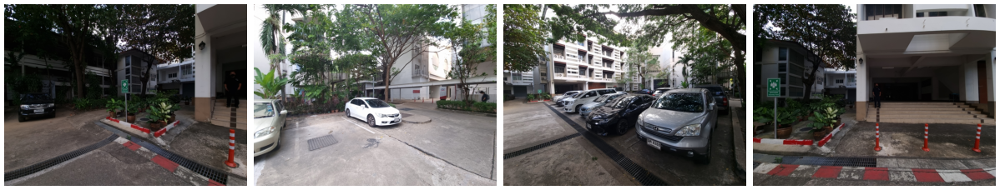

In [3]:
#Not Necessary for mapping.
references = [p.relative_to(images).as_posix() for p in (images / 'db/').iterdir()]

print(len(references), "mapping images")
plot_images([read_image(images / r) for r in references[:4]], dpi=50)
#print(references)

# 2. Extract feature

In [4]:
#Extract features of image with superpoint
extract_features.main(feature_conf, images, feature_path=features)

[2022/11/08 15:06:39 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}
[2022/11/08 15:06:39 hloc INFO] Found 128 images in root datasets/cuparking-20221101.


Loaded SuperPoint model


  0%|          | 0/128 [00:00<?, ?it/s]

[2022/11/08 15:06:54 hloc INFO] Finished exporting features.


PosixPath('outputs/cuparking-20221101/features.h5')

# 3. Global Descriptor

# 3.1. Detect Global Descriptor and pair correspondence images. (This process only use when there are so many mapping image

In [5]:
#Detect global descriptor and pair correspondence images
retrieval_path = extract_features.main(retrieval_conf, images, feature_path=global_des)
pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=30)

[2022/11/08 15:06:54 hloc INFO] Extracting local features with configuration:
{'model': {'name': 'netvlad'},
 'output': 'global-feats-netvlad',
 'preprocessing': {'resize_max': 1024}}
[2022/11/08 15:06:54 hloc INFO] Found 128 images in root datasets/cuparking-20221101.


  0%|          | 0/128 [00:00<?, ?it/s]

[2022/11/08 15:07:32 hloc INFO] Finished exporting features.
[2022/11/08 15:07:32 hloc INFO] Extracting image pairs from a retrieval database.
[2022/11/08 15:07:33 hloc INFO] Found 3840 pairs.


# 3.2. If mapping image is not too much. We can pair them exhaustively.

In [ ]:
pairs_from_exhaustive.main(sfm_pairs, features=features)

# 4. Matching

In [6]:
match_path = match_features.main(matcher_conf, sfm_pairs, features, matches=matches)

[2022/11/08 15:07:33 hloc INFO] Matching local features with configuration:
{'model': {'name': 'superglue',
           'sinkhorn_iterations': 50,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


  0%|          | 0/2427 [00:00<?, ?it/s]

[2022/11/08 15:51:51 hloc INFO] Finished exporting matches.


# 5. Reconstruction

we run incremental Structure-From-Motion and display the reconstructed 3D model.

In [7]:
#Reconstruct 3D sparse model 
model = reconstruction.main(sfm_dir, images, sfm_pairs, features=features, matches=matches, camera_mode=pycolmap.CameraMode.SINGLE)
#Plot the model
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(fig, model, color='rgba(255,0,0,0.5)', name="mapping")
fig.show()

[2022/11/08 15:51:51 hloc INFO] Creating an empty database...
[2022/11/08 15:51:52 hloc INFO] Importing images into the database...
[2022/11/08 15:51:54 hloc INFO] Importing features into the database...


  0%|          | 0/128 [00:00<?, ?it/s]

[2022/11/08 15:51:55 hloc INFO] Importing matches into the database...


  0%|          | 0/3840 [00:00<?, ?it/s]

[2022/11/08 15:51:58 hloc INFO] Performing geometric verification of the matches...
[2022/11/08 15:53:11 hloc INFO] Running 3D reconstruction...
W1108 15:55:02.327854  7157 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W1108 15:55:02.341313  7157 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W1108 15:55:02.343344  7157 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W1108 15:55:02.345325  7157 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform dense Cholesky factorization.
W1108 15:55:02.382125  7157 levenberg_marquardt_strategy.cc:116] Linear solver failure. Failed to compute a step: Eigen failure. Unable to perform 

#  7. Save model as ply file so the model can open in another program.

In [ ]:
#save the file as ply format for open in another software
import pycolmap
reconstruction = pycolmap.Reconstruction(sfm_tri_dir)
reconstruction.export_PLY(sfm_dir / "3D_sparse_model.ply")

We also visualize which keypoints were triangulated into the 3D model.

In [ ]:
visualization.visualize_sfm_2d(trianulated_model, images, color_by='visibility', n=2)

# Localization
Now that we have a 3D map of the scene, we can localize any image. To demonstrate this, we download [a night-time image from Wikimedia](https://commons.wikimedia.org/wiki/File:Paris_-_Basilique_du_Sacr%C3%A9_Coeur,_Montmartre_-_panoramio.jpg).

#  1. Plot query image

In [ ]:

#url = "https://upload.wikimedia.org/wikipedia/commons/5/53/Paris_-_Basilique_du_Sacr%C3%A9_Coeur%2C_Montmartre_-_panoramio.jpg"
# try other queries by uncommenting their url
# url = "https://upload.wikimedia.org/wikipedia/commons/5/59/Basilique_du_Sacr%C3%A9-C%C5%93ur_%285430392880%29.jpg"
# url = "https://upload.wikimedia.org/wikipedia/commons/8/8e/Sacr%C3%A9_C%C5%93ur_at_night%21_%285865355326%29.jpg"
query = 'query/night.jpg'
!mkdir -p $images/query && wget $url -O $images/$query -q
plot_images([read_image(images / query)], dpi=75)

#  2. Extract feature of query image with superpoint, save them to .h5 file. Then, Pair query and db image and match them with superglue.

In [ ]:
extract_features.main(feature_conf, images, image_list=[query], feature_path=features, overwrite=True)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True);

# 3. Localize and estimate pose of query image in 3D sparse model

We read the EXIF data of the query to infer a rough initial estimate of camera parameters like the focal length. Then we estimate the absolute camera pose using PnP+RANSAC and refine the camera parameters.

In [ ]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(r).image_id for r in references]
conf = {
    'estimation': {'ransac': {'max_error': 12}},
    'refinement': {'refine_focal_length': True, 'refine_extra_params': True},
}
localizer = QueryLocalizer(model, conf)
ret, log = pose_from_cluster(localizer, query, camera, ref_ids, features, matches)

print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
visualization.visualize_loc_from_log(images, query, log, model)

# 4. Plot estimated query in sparse model which is plotted in reconstruction process

We visualize the correspondences between the query images a few mapping images. We can also visualize the estimated camera pose in the 3D map.

In [ ]:
pose = pycolmap.Image(tvec=ret['tvec'], qvec=ret['qvec'])
viz_3d.plot_camera_colmap(fig, pose, camera, color='rgba(0,255,0,0.5)', name=query)
fig.show()